In [16]:
import geopandas as gpd
from pyagnps import soil_data_market as sdm

In [20]:
import importlib
importlib.reload(sdm);

### Define a bounding box
This is a bounding box around Goodwin Creek in Panola County, Mississippi
The coordinates are given according to the EPSG:4326 CRS.

In [29]:
# bbox = (-89.94724, 34.22708, -89.76632, 34.31553) # min_lon, min_lat, max_lon, max_lat
# bbox = (-89.94724, 34.22708, -89.0, 35.0) # min_lon, min_lat, max_lon, max_lat
# bbox = (-124.9375, 25.0625, -67.0625, 52.9375) # CONUS min_lon, min_lat, max_lon, max_lat
bbox = (-91.3907,32.1399,-88.7487,35.0769) # Yazoo
# bbox = (-121.0,35.0,-120.85,35.23)

### Query the SSURGO database and collect the data as a GeoDataFrame

In [30]:
gdf = sdm.download_soil_geodataframe_tiles(bbox, tile_size=0.5)
# gdf = sdm.download_soil_geodataframe(bbox)

100%|██████████| 36/36 [17:46<00:00, 29.63s/it]


In [31]:
gdf[gdf['musym']=='W']

,musym,muname,mustatus,slopegraddcp,slopegradwta,brockdepmin,wtdepannmin,wtdepaprjunmin,flodfreqdcd,flodfreqmax,...,urbrecptdcd,urbrecptwta,forpehrtdcp,hydclprs,awmmfpwwta,mukey,mupolygonkey,areasymbol,nationalmusym,geometry
2,W,Water,None,None,None,None,None,None,None,None,...,Not rated,None,Not rated,0,None,1018779,246594371,MS093,1363v,"POLYGON ((-89.68562 34.68990, -89.68565 34.689..."
3,W,Water,None,None,None,None,None,None,None,None,...,Not rated,None,Not rated,0,None,1018779,246594371,MS093,1363v,"POLYGON ((-89.69590 34.69048, -89.69588 34.690..."
4,W,Water,None,None,None,None,None,None,None,None,...,Not rated,None,Not rated,0,None,1018779,246594371,MS093,1363v,"POLYGON ((-89.70932 34.69046, -89.70969 34.690..."
5,W,Water,None,None,None,None,None,None,None,None,...,Not rated,None,Not rated,0,None,1018779,246594371,MS093,1363v,"POLYGON ((-89.71994 34.69441, -89.71952 34.693..."
6,W,Water,None,None,None,None,None,None,None,None,...,Not rated,None,Not rated,0,None,1018779,246594371,MS093,1363v,"POLYGON ((-89.68477 34.69872, -89.68464 34.698..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
427111,W,Water,None,None,None,None,None,None,None,None,...,Not rated,None,Not rated,0,None,808562,246515229,LA065,w4cn,"POLYGON ((-90.95408 32.33335, -90.95378 32.333..."
427112,W,Water,None,None,None,None,None,None,None,None,...,Not rated,None,Not rated,0,None,808562,246515229,LA065,w4cn,"POLYGON ((-90.95829 32.33677, -90.95803 32.336..."
427113,W,Water,None,None,None,None,None,None,None,None,...,Not rated,None,Not rated,0,None,808562,246515229,LA065,w4cn,"POLYGON ((-90.90552 32.34482, -90.90564 32.344..."
427114,W,Water,None,None,None,None,None,None,None,None,...,Not rated,None,Not rated,0,None,808562,246515229,LA065,w4cn,"POLYGON ((-90.89419 32.36177, -90.89365 32.363..."


### Visualization

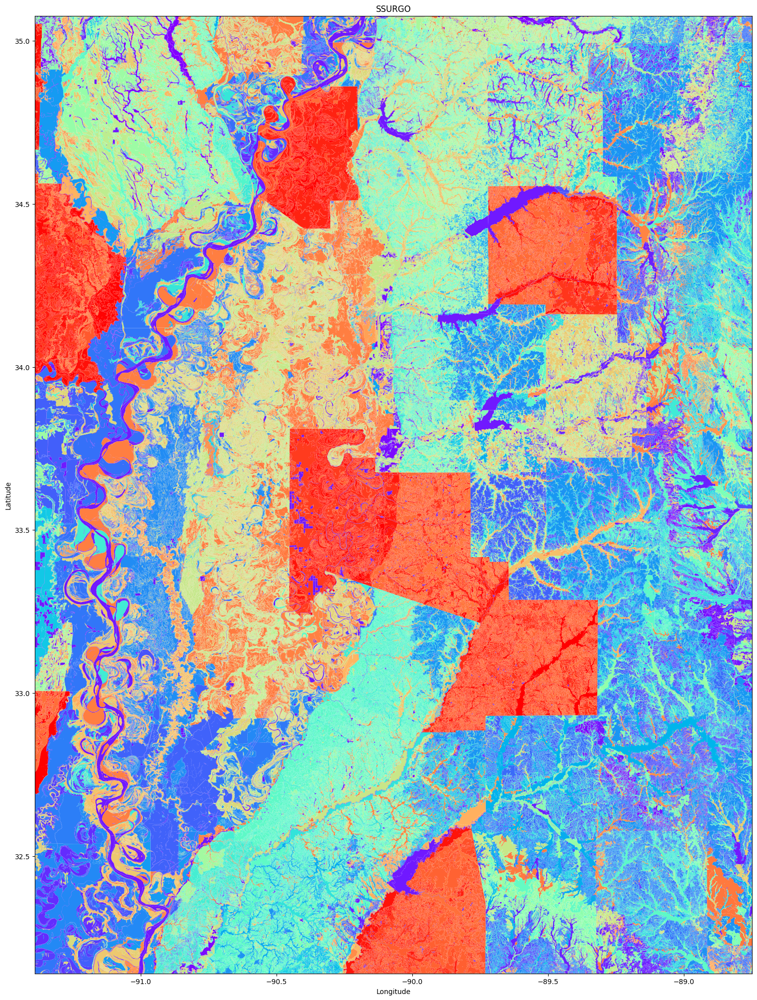

In [35]:
ax = gdf.plot(column='musym', categorical=True, cmap='rainbow_r', legend=False, legend_kwds=dict(loc='upper left', bbox_to_anchor=(1, 1)), figsize=(20,25));
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_xbound((bbox[0], bbox[2]))
ax.set_ybound((bbox[1], bbox[3]))
ax.set_title('SSURGO');


In [33]:
gdf.explore(column='musym', tooltip=False)

OverflowError: string to parse is too long

In [34]:
gdf.to_file('../../outputs/soil_data_market/shapefile/yazoo_ssurgo.gpkg')

In [36]:
merged_gdf = gdf.dissolve(by=['mukey'], as_index=False)

In [37]:
merged_gdf

,mukey,geometry,musym,muname,mustatus,slopegraddcp,slopegradwta,brockdepmin,wtdepannmin,wtdepaprjunmin,...,engcmssdcd,engcmssmp,urbrecptdcd,urbrecptwta,forpehrtdcp,hydclprs,awmmfpwwta,mupolygonkey,areasymbol,nationalmusym
0,1908238,"MULTIPOLYGON (((-89.80568 34.22776, -89.80560 ...",W,Water,None,None,None,None,None,None,...,Not rated,Not rated,Not rated,None,Not rated,0,None,246697254,MS107,221p2
1,2108778,"MULTIPOLYGON (((-89.87505 34.23093, -89.87519 ...",GP,Gravel pits,None,None,None,None,None,None,...,Not rated,Not rated,Not rated,None,Not rated,0,None,246706041,MS107,28sc3
2,568307,"MULTIPOLYGON (((-89.92411 34.23692, -89.92433 ...",CaA,"Calloway silt loam, 0 to 2 percent slopes",None,1,1,None,41,41,...,Poor,Poor,Somewhat limited,0.74,Slight,3,1,246702640,MS107,m2ch
3,568308,"MULTIPOLYGON (((-89.93694 34.23213, -89.93683 ...",CaB,"Calloway silt loam, 2 to 5 percent slopes",None,4,3.9,None,41,41,...,Poor,Poor,Somewhat limited,0.74,Moderate,3,1,246691032,MS107,m2cj
4,568309,"MULTIPOLYGON (((-89.89424 34.22759, -89.89403 ...",Cm,Collins silt loam (occasionally flooded),None,1,1,None,107,107,...,Poor,Poor,Somewhat limited,0.094,Slight,3,0.613,246699070,MS107,m2ck
5,568310,"MULTIPOLYGON (((-89.89745 34.22806, -89.89736 ...",Co,"Collins silt loam, local alluvium (occasionall...",None,1,1,None,107,107,...,Poor,Poor,Somewhat limited,0.112,Slight,3,0.613,246692147,MS107,m2cl
6,568311,"MULTIPOLYGON (((-89.83669 34.23234, -89.83683 ...",CpF2,"Cuthbert and Providence soils, 12 to 35 percen...",None,24,21.2,None,46,None,...,Poor,Fair,Somewhat limited,0.985,Severe,2,1,246692877,MS107,m2cm
7,568313,"MULTIPOLYGON (((-89.89900 34.22747, -89.89884 ...",Fa,Falaya silt loam (occasionally flooded),None,1,1,None,46,46,...,Poor,Poor,Somewhat limited,0.492,Slight,10,1,246700043,MS107,m2cp
8,568314,"MULTIPOLYGON (((-89.91270 34.23189, -89.91238 ...",Fl,"Falaya silt loam, local alluvium (occasionally...",None,1,1,None,46,46,...,Poor,Poor,Somewhat limited,0.492,Slight,10,1,246698044,MS107,m2cq
9,568318,"MULTIPOLYGON (((-89.85807 34.31257, -89.85786 ...",GrB,"Grenada silt loam, 2 to 5 percent slopes",None,4,4,None,58,58,...,Poor,Poor,Somewhat limited,0.065,Moderate,0,1,246700267,MS107,m2cv


In [35]:
merged_gdf.explore(column='mukey')

In [31]:
gdf.columns.difference(['geometry'])

Index(['areasymbol', 'awmmfpwwta', 'aws0100wta', 'aws0150wta', 'aws025wta',
       'aws050wta', 'brockdepmin', 'drclassdcd', 'drclasswettest',
       'engcmssdcd', 'engcmssmp', 'engdwbdcd', 'engdwbll', 'engdwbml',
       'engdwobdcd', 'englrsdcd', 'engsldcd', 'engsldcp', 'engstafdcd',
       'engstafll', 'engstafml', 'flodfreqdcd', 'flodfreqmax', 'forpehrtdcp',
       'hydclprs', 'hydgrpdcd', 'iccdcd', 'iccdcdpct', 'mukey', 'muname',
       'mupolygonkey', 'mustatus', 'musym', 'nationalmusym', 'niccdcd',
       'niccdcdpct', 'pondfreqprs', 'slopegraddcp', 'slopegradwta',
       'urbrecptdcd', 'urbrecptwta', 'wtdepannmin', 'wtdepaprjunmin'],
      dtype='object')

### Save to shapefile

In [5]:
filepath_shp_file = '../../outputs/soil_data_market/shapefile/goodwin_creek_ssurgo.shp'

gdf.to_file(filepath_shp_file)

C:\Users\Luc\AppData\Local\Temp\ipykernel_19816\3016940077.py:3: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdf.to_file(filepath_shp_file)
